In [1]:
import os
import sys
import json
import argparse
import pickle

import numpy as np
from PIL import Image, ImageDraw
import imageio

import torch
import clip
from torchvision import transforms

# for visualization
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline

## The model takes image, text and a 3D contact point as inputs.
- Image: load the image from disk.
- text: a string that describes the task to be performed.
- 3D contact point: shows where the contact is happening in the scene.

The 3D contact point is computed using the following steps:
- User prompt by clicking a point on the image.
- Off-the-shelf depth model (UniDepth) to get the depth map of the image.
- Depth is unprojected to 3D space using the camera intrinsics.

In [2]:
# load image
img_file = './demo/examples/00300.jpg'
img = Image.open(img_file)

# click one point on the image
from jupyter_bbox_widget import BBoxWidget
from IPython.display import display
import ipywidgets as widgets

# ignore the 'Skip' and 'Submit' buttons in the widget
# just click a point and move to the next cell
widget = BBoxWidget(image=img_file, mode="point")
widget.layout = widgets.Layout(width='600px', height='auto')
display(widget)

BBoxWidget(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#b…

Clicked points: [(458, 188)]


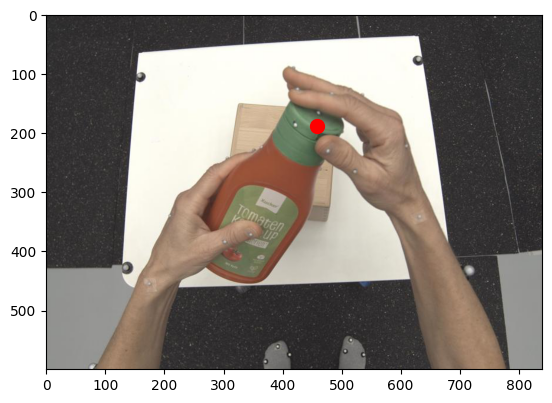

In [3]:
# get the point from widget and plot on image
points = [(widget.bboxes[0]['x'], widget.bboxes[0]['y'])]
print ('Clicked points:', points)
plt.close()
plt.imshow(img)
plt.scatter(*zip(*points), c='r', s=100)
plt.show()

## Running [UniDepth](https://github.com/lpiccinelli-eth/UniDepth)

Here, we use UniDepth to get the depth map. This works best of all the depth models tested. To unproject the depth map to 3D space, we need the camera intrinsics. You can use ground truth intrinsics if available or use the estimated intrinsics from UniDepth. Here, we use the estimated intrinsics.

In [ ]:
# load UniDepth model
version = "v2"
backbone = "vitl14"

model = torch.hub.load("lpiccinelli-eth/UniDepth", "UniDepth", version=version, backbone=backbone, pretrained=True, trust_repo=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
print (f"Using device: {device}")

/home/adityap9/.cache/torch/hub/lpiccinelli-eth_UniDepth_main/unidepth/models/unidepthv2/unidepthv2.py:262: UserWarning: !! self.resolution_level not set, using default bounds !!
  warnings.warn("!! self.resolution_level not set, using default bounds !!")


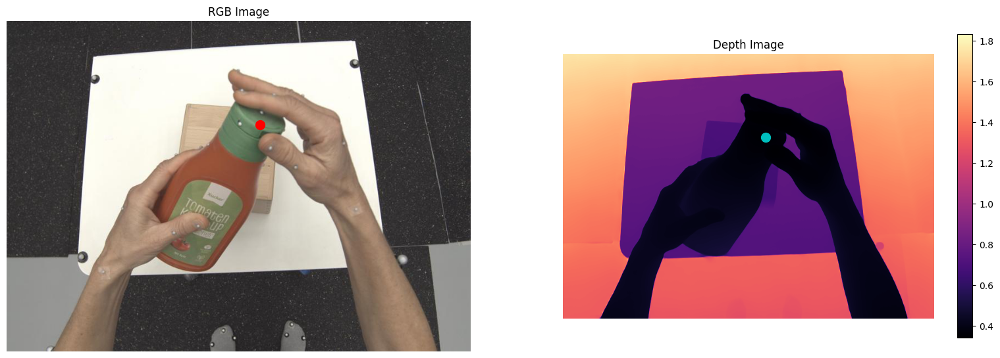

In [5]:
# Run UniDepth inference on the image
rgb = torch.from_numpy(np.array(img)).permute(2, 0, 1) # C, H, W
w, h = rgb.shape[2], rgb.shape[1]

predictions = model.infer(rgb)
# predictions = model.infer(rgb, intrinsics) # Uncomment this line if you have intrinsics

# Metric Depth Estimation
depth = predictions["depth"]
# Point Cloud in Camera Coordinate
xyz = predictions["points"]
# Intrinsics Prediction
intrinsics = predictions["intrinsics"]

# plot rgb and depth side by side
plt.close()
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(np.array(img))
ax[0].set_title("RGB Image")
ax[0].scatter(*zip(*points), c='r', s=100)
ax[0].axis('off')
depth_np = depth[0,0].cpu().numpy()
ax[1].imshow(depth_np, cmap='magma')
ax[1].set_title("Depth Image")
ax[1].scatter(*zip(*points), c='c', s=100)
ax[1].axis('off')
# show colorbar
plt.colorbar(ax[1].imshow(depth_np, cmap='magma'), ax=ax[1], shrink=0.6)
plt.show()

In [18]:
# # visualize depth using plotly
# import plotly.graph_objects as go

# depth_image = depth_np.copy()

# # Create a 3D surface plot
# fig = go.Figure(
#     data=go.Surface(
#         z=depth_image,  # Depth values as the height
#         colorscale='Viridis',  # Choose a color scale like 'Viridis', 'Cividis', 'Jet', etc.
#         colorbar=dict(title="Depth"),  # Add a colorbar with a label
#     )
# )

# # Update the layout for better visualization
# fig.update_layout(
#     title="3D Depth Image Visualization",
#     scene=dict(
#         xaxis_title="X-axis (pixels)",
#         yaxis_title="Y-axis (pixels)",
#         zaxis_title="Depth",
#     ),
#     margin=dict(l=0, r=0, t=50, b=0),  # Reduce margins for better fit
# )

# # Show the 3D plot
# fig.show()

In [6]:
def unproject_depth_to_3d(depth_map, intrinsic_matrix):
    """
    Unproject a 2D depth map to 3D coordinates using the camera intrinsic matrix.

    Parameters:
    - depth_map (np.ndarray): 2D array of shape (H, W) containing depth values.
    - intrinsic_matrix (np.ndarray): 3x3 intrinsic matrix of the camera.

    Returns:
    - points_3d (np.ndarray): 3D coordinates of shape (H, W, 3).
    """
    H, W = depth_map.shape
    fx = intrinsic_matrix[0, 0]
    fy = intrinsic_matrix[1, 1]
    cx = intrinsic_matrix[0, 2]
    cy = intrinsic_matrix[1, 2]

    # Create a grid of (u, v) coordinates
    u, v = np.meshgrid(np.arange(W), np.arange(H))

    # Compute the 3D coordinates
    X = (u - cx) * depth_map / fx
    Y = (v - cy) * depth_map / fy
    Z = depth_map

    # Stack X, Y, Z into a single (H, W, 3) array
    points_3d = np.dstack((X, Y, Z))

    return points_3d

# compute 3D points from depth using the intrinsic matrix
intrx = intrinsics[0].cpu().numpy()
points_3d = unproject_depth_to_3d(depth_np, intrx)

# 3D points of clicked pixels
contact = points_3d[points[0][1], points[0][0]]

# # this can also be computed by xyz directly, both lead to same result when using estimated intrinsics
# pred_points_3d = xyz[0].permute(1,2,0).cpu().numpy()  # Transpose to get (H, W, 3)
# pred_contact_3d = pred_points_3d[points[0][1], points[0][0]]
# print (pred_points_3d.shape, pred_contact_3d)

contact_point_3d = np.array(contact)
print (contact_point_3d)


[ 0.02128908 -0.06273666  0.35141984]


## Processing image and text to get features

For image, we get pretrained features from DeiT. For text, we use CLIP.

In [7]:
DEVICE = device
from timm import create_model
vit = create_model('deit_base_patch16_224', pretrained=True)
vit.head = torch.nn.Identity()
vit = vit.to(DEVICE)
vit.eval()

image = Image.open(img_file)
normalize_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
max_dim = max(image.size)
pad = (max_dim - image.size[0], max_dim - image.size[1])
image = np.array(image)
# pad image to make it square, keep the image in the center
image = np.pad(image, ((pad[1]//2, pad[1] - pad[1]//2), (pad[0]//2, pad[0] - pad[0]//2), (0, 0)), mode='constant')
image = Image.fromarray(image)
norm_img = normalize_img(image)
input_tensor = norm_img.unsqueeze(0).to(DEVICE)

# Extract image features
with torch.no_grad():
    image_features = vit(input_tensor)

# describe the action to be performed
text_input = 'open cap'
model, preprocess = clip.load("ViT-B/32", device=DEVICE)
# Tokenize the text and move it to the appropriate device
text_tokens = clip.tokenize([text_input]).to(DEVICE)
# Compute the text features
with torch.no_grad():
    text_features = model.encode_text(text_tokens)

print (image_features.shape, text_features.shape)

torch.Size([1, 768]) torch.Size([1, 512])


## Load the model checkpoints and arguments

In [9]:
# for running the model
from common.renderer import Renderer 
import common.rotation_conversions as rot_conv

from models.mano.wrapper import MANO, LIGHT_BLUE
from models.prior.learned_prior import LearnedPrior
from models.vq.model import RVQVAE
from utils.eval_fn import EvalWrapper, prior_forward_pass
from utils.get_opt import get_opt
from utils.metrics import *

In [ ]:
# instantiate MANO model
# os.environ['MANO_PATH'] = <path_to_mano_directory>, this path needs to be set
mano_right = MANO(model_path=os.environ['MANO_PATH'], gender='neutral', num_hand_joints=15, create_body_pose=False)
# instantiate the renderer
img_w, img_h = img.size
renderer = Renderer(mano_right.faces, img_res=(img_w, img_h))

In [14]:
# load model arguments
ckpt_dir = './demo/model'
prior_ckpt = os.path.join(ckpt_dir, 'indexer.tar')
model_ckpt = os.path.join(ckpt_dir, 'interpred.tar')
model_opt = os.path.join(ckpt_dir, 'opt.txt')

# load the model opt
opt = get_opt(model_opt, DEVICE)
opt.is_train = False

# load the prior opt
prior_opt = opt.__dict__.copy()
prior_opt = argparse.Namespace(**prior_opt)
prior_opt.dropout = 0.0
prior_opt.use_contact_points = True

# define additional options required by the model
if 'joints' in opt.motion_type:
    opt.joints_num = 21
    if 'tf' in opt.model_type:
        opt.dim_pose = 3
    else:
        opt.dim_pose = 63
elif 'mano' in opt.motion_type:
    opt.joints_num = 21
    opt.dim_pose = 48+10+3 # 48 for thetas, 10 for betas, 3 for cam_t
    if opt.coord_sys == 'contact':
        opt.dim_pose += 3 # 3 for translation to contact centroid at current timestep
        opt.dim_pose += 3 # 3 for translation component of transformation to contact centroid at reference timestep
    
    if opt.pred_cam: # are additional params need or can these can be subsumed into mano params (doesn't work for well)
        opt.dim_pose += 6 # for cam rotation
        opt.dim_pose += 3 # for cam translation
else:
    raise ValueError('Unknown motion type')

Reading ./demo/model/opt.txt


In [ ]:
# load the model
opt.feedforward = False
opt.diffusion = False
opt.eval_model = None
opt.transfer_from = None
opt.load_indices = None # used for compatibility with RVQVAE instantiation below

# load decoder
net = RVQVAE(opt, opt.dim_pose, opt.nb_code, opt.code_dim, opt.code_dim, opt.down_t, opt.stride_t, 
             opt.width, opt.depth,  opt.dilation_growth_rate, opt.vq_act, opt.vq_norm, opt=opt).to(opt.device)
eval_wrapper = EvalWrapper(opt, vq_model=net)
eval_wrapper.vq_model.load_vqvae_model(model_ckpt, decoder=True, quantizer=True, mode='latest', feedforward=opt.feedforward)
eval_wrapper.vq_model.to(opt.device)
eval_wrapper.vq_model.eval()

if 'mano' in opt.motion_type:
    eval_wrapper.mano_mean = torch.zeros(61).to(opt.device).float()
    eval_wrapper.mano_std = torch.ones(61).to(opt.device).float()

# load the prior
prior = LearnedPrior(prior_opt).to(opt.device)
prior.load_state_dict(torch.load(prior_ckpt, map_location=opt.device))
prior.eval()

print ('Loaded model and prior')

## 3D Voxel Grid

Compute 3D voxel grid with ranges predefined during training and create a gaussian blob around the 3D contact point

In [17]:
def gaussian_kernel(size=5, sigma=1.0):
    """
    Generate a 3D Gaussian kernel.

    Args:
        size (int): The size of the kernel (size x size x size).
        sigma (float): The standard deviation of the Gaussian.

    Returns:
        np.ndarray: 3D Gaussian kernel.
    """
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy, zz = np.meshgrid(ax, ax, ax)
    kernel = np.exp(-(xx**2 + yy**2 + zz**2) / (2. * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel

def compute_gaussian_heatmap(point, volume, sigma=1.0):
    """
    Compute a 3D Gaussian heatmap around a point within a given volume.

    Args:
        point (np.ndarray): The point around which to create the Gaussian heatmap (normalized to [0, 1]).
        volume (np.ndarray): The 3D volume grid.
        sigma (float): The standard deviation of the Gaussian.

    Returns:
        np.ndarray: The volume with the Gaussian heatmap added.
    """
    grid_size = volume.shape[0]
    kernel_size = int(2 * np.ceil(3 * sigma) + 1)
    kernel = gaussian_kernel(kernel_size, sigma)
    
    # Compute the center of the kernel in the volume
    center = (point * (grid_size - 1)).astype(int)
    
    # Define the ranges for the kernel placement
    x_start = max(center[0] - kernel_size // 2, 0)
    x_end = min(center[0] + kernel_size // 2 + 1, grid_size)
    y_start = max(center[1] - kernel_size // 2, 0)
    y_end = min(center[1] + kernel_size // 2 + 1, grid_size)
    z_start = max(center[2] - kernel_size // 2, 0)
    z_end = min(center[2] + kernel_size // 2 + 1, grid_size)
    
    # Define the ranges for the kernel itself
    kx_start = max(kernel_size // 2 - center[0], 0)
    kx_end = min(kernel_size // 2 + (grid_size - center[0]), kernel_size)
    ky_start = max(kernel_size // 2 - center[1], 0)
    ky_end = min(kernel_size // 2 + (grid_size - center[1]), kernel_size)
    kz_start = max(kernel_size // 2 - center[2], 0)
    kz_end = min(kernel_size // 2 + (grid_size - center[2]), kernel_size)
    
    # Add the Gaussian kernel to the volume
    volume[x_start:x_end, y_start:y_end, z_start:z_end] += kernel[kx_start:kx_end, ky_start:ky_end, kz_start:kz_end]
    
    return volume

# get the fixed extent of the grid, computed from training data
range_file = './demo/model/ranges.pkl'
assert os.path.exists(range_file), f'Cannot find range file: {range_file}. Please generate it first.'
with open(range_file, 'rb') as f:
    ranges = pickle.load(f)

x_range, y_range, z_range = ranges['x_range'], ranges['y_range'], ranges['z_range']

# create a 3D grid normalized to [0, 1] in x_range, y_range, z_range
grid_size = opt.contact_grid
x_grid = np.linspace(x_range[0], x_range[1], grid_size)
y_grid = np.linspace(y_range[0], y_range[1], grid_size)
z_grid = np.linspace(z_range[0], z_range[1], grid_size)
x_grid, y_grid, z_grid = np.meshgrid(x_grid, y_grid, z_grid)
grid = np.stack([x_grid, y_grid, z_grid], axis=-1)
print (grid.shape)

near, far = np.array([x_range[0], y_range[0], z_range[0]]), np.array([x_range[1], y_range[1], z_range[1]])
# compute contact volume
contact_volume = np.zeros((grid_size, grid_size, grid_size))
cp = contact_point_3d.copy()
contact_norm = (cp - near) / (far - near)
contact_volume = compute_gaussian_heatmap(contact_norm, contact_volume)
print (contact_volume.shape)

(16, 16, 16, 3)
(16, 16, 16)


In [18]:
# reshape all tensors to match the expected input shape for the model
bz, ts = 1, 1 # only t=0 inputs at test time
text_feats = text_features.reshape(bz, ts, -1).repeat(1, opt.window_size, 1)
video_feats = image_features.reshape(bz, ts, -1).repeat(1, opt.window_size, 1)
contact_point = torch.from_numpy(contact_point_3d).float().reshape(bz, ts, -1).repeat(1, opt.window_size, 1)
contact = torch.from_numpy(contact_volume).float().reshape(bz, ts, grid_size, grid_size, grid_size).repeat(1, opt.window_size, 1, 1, 1)
contact_mask = torch.ones(contact.shape[:2])
grid = torch.from_numpy(grid).float().reshape(bz, grid_size, grid_size, grid_size, 3)#.repeat(1, opt.window_size, 1, 1, 1, 1)
grid_mask = torch.ones((grid.shape[0],1))
print (text_feats.shape, video_feats.shape, contact_point.shape, contact.shape, grid.shape)

data = {}
data['text_feats'] = text_feats.float().to(opt.device)
data['video_feats'] = video_feats.float().to(opt.device)
data['contact_point'] = contact_point.float().to(opt.device)
data['contact'] = contact.float().to(opt.device)
data['contact_mask'] = contact_mask.float().to(opt.device)
data['grid'] = grid.float().to(opt.device)
data['grid_mask'] = grid_mask.float().to(opt.device)

torch.Size([1, 30, 512]) torch.Size([1, 30, 768]) torch.Size([1, 30, 3]) torch.Size([1, 30, 16, 16, 16]) torch.Size([1, 16, 16, 16, 3])


In [32]:
# plot contact_point in 3D grid using plotly
# import plotly.graph_objects as go
# cpoint = contact[0,0].clone().detach().cpu().numpy()
# fig = go.Figure(data=go.Volume(
#     x=x_grid.flatten(),
#     y=y_grid.flatten(),
#     z=z_grid.flatten(),
#     value=cpoint.flatten(),
#     isomin=0.1,
#     isomax=0.0,
#     opacity=0.1, # needs to be small to see through all surfaces
#     surface_count=17, # needs to be a large number for good volume rendering
#     ))
# fig.update_layout(scene=dict(aspectmode='cube'))
# fig.show()

## Running inference

In [20]:
with torch.no_grad():
    codebook_indices = prior_forward_pass(prior, data, prior_opt, stochastic=opt.stochastic) # get codebook indices using Indexer
    data['code_idx'] = codebook_indices.reshape(-1, opt.window_size*opt.num_quantizers)
    outs = eval_wrapper.demo(data) # run the InterPred model to get predictions, either 'val' or 'test' mode works
if isinstance(outs, tuple):
    outs = outs[-1]
pred_motion = outs['pred_motion'] # this is the predicted motion from our model

motion = pred_motion.detach().cpu()
if opt.contact_map:
    is_contact = True
    pred_contact_maps = torch.sigmoid(motion[..., -778:]) > 0.5
    pred_contact_maps = pred_contact_maps.float()
    contact_maps = pred_contact_maps.long().numpy()
    motion = motion[..., :-778]

## Visualize the predictions

3 types of visualizations are shown here:
- Rendering the 3D mesh for the predictions from multiple viewpoints using MANO mesh
- Creating video from rendered frames on a checkboard background
- Interaction 3D visualizations of 3D point cloud using plotly

In [21]:
curr_intrinsics = intrx.copy()
# print ('Using intrinsics:', curr_intrinsics)
focal = (curr_intrinsics[0, 0] + curr_intrinsics[1, 1] ) / 2
img_w, img_h = img.size
misc_args = dict(
        mesh_base_color=LIGHT_BLUE,
        scene_bg_color = (1.0, 1.0, 1.0),
        focal_length = focal, # for holoassist
        camera_z = 0, # check what works, 0.25 is reasonable for visualizations
        render_res = (img_w, img_h)
    )

In [22]:
save_dir = './demo/out'
bz, ts = pred_motion.shape[:2]
assert bz == 1 # runs for a single sample
first_img = img.copy()
verb, noun = text_input.split(' ')
name = f'{verb}+{noun}'
curr_dir = os.path.join(save_dir, name)
os.makedirs(curr_dir, exist_ok=True)
meta_data = {'verb': verb, 'noun': noun, 'img_name': img_file}
meta_file = os.path.join(curr_dir, f'{name}.json')
with open(meta_file, 'w') as fp:
    json.dump(meta_data, fp)

pjoin = os.path.join
os.makedirs(curr_dir, exist_ok=True)
raw_image_dir = pjoin(curr_dir, 'raw_image')
posed_hand_dir = pjoin(curr_dir, 'pose_hand')
center_contact_dir = pjoin(curr_dir, 'center_contact')
other_hand_dir = pjoin(curr_dir, 'other_hand')
contact_dir = pjoin(curr_dir, 'contact_map')
os.makedirs(raw_image_dir, exist_ok=True)
os.makedirs(posed_hand_dir, exist_ok=True)
os.makedirs(center_contact_dir, exist_ok=True)
os.makedirs(other_hand_dir, exist_ok=True)
os.makedirs(contact_dir, exist_ok=True)

# save img_file in raw_image_dir
img_path = pjoin(raw_image_dir, f'{name}.jpg')
img.save(img_path)

In [23]:
b = 0 # support only batch size of 1 for now
posed_verts, nview_verts, cc_verts, contact_verts = [], [], [], []
first_verts_contact = contact_point_3d[None].copy()
for t in range(ts):
    curr_motion = motion[b, t]
    global_orient = curr_motion[:3][None]
    global_orient = rot_conv.axis_angle_to_matrix(global_orient).detach().view(1, -1, 3, 3)
    hand_pose = curr_motion[3:48][None]
    hand_pose = rot_conv.axis_angle_to_matrix(hand_pose.view(-1, 3)).detach().view(1, -1, 3, 3)
    betas = curr_motion[48:58][None]
    
    mano_output = mano_right(global_orient=global_orient, hand_pose=hand_pose, betas=betas, pose2rot=False)
    mano_joints = mano_output.joints[0].detach()
    mano_verts = mano_output.vertices[0].detach()

    # move to the camera at current timestep
    cam_t = curr_motion[58:61][None]
    cam_verts = mano_verts + cam_t

    # move to the camera at reference timestep using pred matrix
    pred_cam_rot = curr_motion[...,-9:-3]
    pred_cam_transl = curr_motion[...,-3:]
    pred_cam_rot = rot_conv.rotation_6d_to_matrix(pred_cam_rot).view(3, 3)
    pred_cam_rot = torch.eye(3)
    # convert to 4x4 matrix
    cam2ref_transf = torch.cat([pred_cam_rot, pred_cam_transl[...,None]], dim=-1)
    cam2ref_transf = torch.cat([cam2ref_transf, torch.tensor([[0, 0, 0, 1]])], dim=0)

    # transform the vertices
    cam2ref_transf = cam2ref_transf[None].repeat(mano_verts.shape[0], 1, 1)
    mano_verts_homo = torch.cat([cam_verts, torch.ones((mano_verts.shape[0], 1))], axis=-1) # check if mano_verts instead of cam_verts
    cam2ref_verts = torch.bmm(cam2ref_transf, mano_verts_homo[:, :, None])[:, :, 0]
    ref_verts = cam2ref_verts[..., :3].numpy()
    viz_verts = ref_verts.copy()

    if is_contact:
        contact_map = contact_maps[b,t]
        # create new dict
        curr_args = misc_args.copy()
        curr_args.update({'contact_vertices': contact_map})

    posed_verts.append(ref_verts.copy())
    cc_verts.append(ref_verts.copy())
    contact_verts.append(contact_map)
    other_verts = ref_verts.copy()
    if t == 0:
        other_mean = other_verts.mean(axis=0, keepdims=True)
    other_verts = other_verts - other_mean
    if isinstance(other_verts, torch.Tensor):
        nview_verts.append(other_verts.cpu().numpy())
    else:
        nview_verts.append(other_verts)

    # render a flat hand to show the contact map only
    rot_mat_y = np.array([[0, 0, 1], [0, 1, 0], [-1, 0, 0]])
    global_orient = torch.from_numpy(rot_mat_y).float().view(1, 1, 3, 3) # this followed by a 90 degree rotation around x-axis will make the hand vertical
    hand_pose = torch.eye(3).view(1,1,3,3).repeat(1,15,1,1)
    betas = curr_motion[48:58][None]
    mano_output = mano_right(global_orient=global_orient, hand_pose=hand_pose, betas=betas, pose2rot=False)
    mano_verts = mano_output.vertices[0].detach()
    mano_verts = mano_verts - mano_verts.mean(dim=0, keepdim=True) # debug this
    curr_args.update({'rot_angle': 90, 'rot_axis': (1, 0, 0)})
    curr_args['camera_z'] = 0.25 # for better positioning of hand for visualization,
    render_img = renderer.render_rgba_contact(mano_verts.numpy(), **curr_args)
    flat_img = Image.fromarray((render_img[..., :3] * 255).astype(np.uint8))

    save_idx = t
    flat_img.save(pjoin(contact_dir, f'{save_idx:06d}.jpg'))

curr_args = misc_args.copy()
curr_args['contact_vertices'] = contact_verts
# center posed_verts along x and y dims
all_posed_vs = np.stack(posed_verts).reshape(-1, 3)
posed_centroid = all_posed_vs.mean(axis=0, keepdims=True)
for i in range(len(posed_verts)):
    posed_verts[i][:,0] -= posed_centroid[..., 0]
    posed_verts[i][:,1] -= posed_centroid[..., 1]
other_args = curr_args.copy()
# center first_verts_contact along x and y dims
first_contact = first_verts_contact.copy()
first_contact[..., 0] -= posed_centroid[..., 0]
first_contact[..., 1] -= posed_centroid[..., 1]
# project first_contact to image
verts_cam = np.dot(curr_intrinsics, first_contact.T).T
verts_px = verts_cam[:, :2] / verts_cam[:, 2][:, None]
first_verts_px = verts_px.copy()
pos_img = renderer.render_multiple_contacts(posed_verts, fading_factor=0.97, **other_args)
# plot first_verts_px on bg_img
pos_img = Image.fromarray((pos_img[..., :3] * 255).astype(np.uint8))
pos_draw = ImageDraw.Draw(pos_img)
pt_size = 20
for pt in first_verts_px:
    pos_draw.ellipse([pt[0]-pt_size, pt[1]-pt_size, pt[0]+pt_size, pt[1]+pt_size], fill='cyan')
pos_img = np.array(pos_img) / 255.0

# iterate over posed_verts and render each one
for t in range(ts):
    curr_verts = posed_verts[t]
    curr_args = other_args.copy()
    curr_args['contact_vertices'] = contact_verts[t]
    rend_img = renderer.render_rgba_contact(curr_verts, **curr_args)
    rend_img = Image.fromarray((rend_img[..., :3] * 255).astype(np.uint8))
    # draw a cyan dot at first_verts_px
    draw = ImageDraw.Draw(rend_img)
    pt_size = 20
    for pt in first_verts_px:
        draw.ellipse([pt[0]-pt_size, pt[1]-pt_size, pt[0]+pt_size, pt[1]+pt_size], fill='cyan')
    rend_img.save(pjoin(posed_hand_dir, f'{t:06d}.jpg'))

curr_args = misc_args.copy()
curr_args['contact_vertices'] = contact_verts
other_args = curr_args.copy()
first_contact = first_verts_contact.copy()
# project first_contact to image
verts_cam = np.dot(curr_intrinsics, first_contact.T).T
verts_px = verts_cam[:, :2] / verts_cam[:, 2][:, None]
first_verts_px = verts_px.copy()
cam_img = renderer.render_multiple_contacts(cc_verts, fading_factor=0.97, **other_args)
# also render on first image
other_args['bg_image'] = np.array(img).copy()
bg_img = renderer.render_multiple_contacts(cc_verts, fading_factor=0.97, **other_args)
# plot first_verts_px on bg_img
bg_img = Image.fromarray((bg_img[..., :3] * 255).astype(np.uint8))
bg_draw = ImageDraw.Draw(bg_img)
pt_size = 20
for pt in first_verts_px:
    bg_draw.ellipse([pt[0]-pt_size, pt[1]-pt_size, pt[0]+pt_size, pt[1]+pt_size], fill='cyan')
bg_img = np.array(bg_img) / 255.0

curr_args = misc_args.copy()
curr_args['contact_vertices'] = contact_verts
other_args = curr_args.copy()
other_args.update({'rot_angle': 90, 'rot_axis': (0, 1, 0)})
other_args['camera_z'] = 0.25
other_img = renderer.render_multiple_contacts(nview_verts, fading_factor=0.97, **other_args)

# iterate over nview_verts and render each one
for t in range(ts):
    curr_verts = nview_verts[t]
    curr_args = other_args.copy()
    curr_args['contact_vertices'] = contact_verts[t]
    rend_img = renderer.render_rgba_contact(curr_verts, **curr_args)
    rend_img = Image.fromarray((rend_img[..., :3] * 255).astype(np.uint8))
    rend_img.save(pjoin(other_hand_dir, f'{t:06d}.jpg'))

# save pos_img, cam_img, other_img
pos_motion = Image.fromarray((pos_img[..., :3] * 255).astype(np.uint8))
cam_motion = Image.fromarray((cam_img[..., :3] * 255).astype(np.uint8))
bg_motion = Image.fromarray((bg_img[..., :3] * 255).astype(np.uint8))
other_motion = Image.fromarray((other_img[..., :3] * 255).astype(np.uint8))

pos_motion.save(pjoin(curr_dir, f'posed_motion.jpg')) # rendered in camera frame and centered at x- & y- value of the motion centroid
cam_motion.save(pjoin(curr_dir, f'cam_motion.jpg')) # rendered in camera frame
bg_motion.save(pjoin(curr_dir, f'bg_motion.jpg')) # rendered in camera frame on the original image
other_motion.save(pjoin(curr_dir, f'other_motion.jpg')) # rendered from a different camera viewpoint

In [25]:
# Render videos of hand and contact trajectories on checkerboard background
# show the input image with contact point on the top left corner

from common.renderer import get_text_image
# Draw the clicked points on the checkerboard image
downsize_factor = 4  # Downsize factor for the checkerboard image
contact_img = img.convert("RGBA").copy()  # Ensure image is in RGBA mode
draw = ImageDraw.Draw(contact_img)
for pt in points:
    draw.ellipse([pt[0]-20, pt[1]-20, pt[0]+20, pt[1]+20], fill='red', outline='red')  # Draw a red circle around the clicked point
# Resize the image to downsize_factor
img_resized = contact_img.resize(
    (contact_img.width // downsize_factor, contact_img.height // downsize_factor),
    resample=Image.Resampling.LANCZOS  # Use LANCZOS instead of deprecated ANTIALIAS
)

posed_checker_dir = pjoin(curr_dir, 'pose_checker')
other_checker_dir = pjoin(curr_dir, 'other_checker')
os.makedirs(posed_checker_dir, exist_ok=True)
os.makedirs(other_checker_dir, exist_ok=True)

writer = imageio.get_writer(pjoin(posed_checker_dir, 'posed_motion_checkerboard.mp4'), fps=5)
for t in range(ts):
    curr_verts = posed_verts[t]
    # curr_args = other_args.copy()
    curr_args = misc_args.copy()
    curr_args['contact_vertices'] = contact_verts[t]
    curr_args['checkerboard'] = True
    rend_img = renderer.render_rgba_contact(curr_verts, **curr_args)
    rend_img = Image.fromarray((rend_img[..., :3] * 255).astype(np.uint8))
    rend_img.save(pjoin(posed_checker_dir, f'{t:06d}.jpg'))
    combined_img = get_text_image(text_input, img_resized.copy(), font_scale=0.5, thickness=1)
    rend_img.paste(combined_img, (0, 0), mask=combined_img.convert("RGBA"))
    # Write the rendered image to the video file
    writer.append_data(np.array(rend_img))
writer.close()
print ('Saved video for posed motion on checkerboard')

# iterate over nview_verts and render each one
writer = imageio.get_writer(pjoin(other_checker_dir, 'other_motion_checkerboard.mp4'), fps=5)
for t in range(ts):
    curr_verts = nview_verts[t]
    # curr_args = other_args.copy()
    curr_args = misc_args.copy()
    # curr_args.update({'rot_angle': 90, 'rot_axis': (0, 1, 0)})
    curr_args['contact_vertices'] = contact_verts[t]
    curr_args['checkerboard'] = True
    curr_args['camera_top_down'] = True
    rend_img = renderer.render_rgba_contact(curr_verts, **curr_args)
    rend_img = Image.fromarray((rend_img[..., :3] * 255).astype(np.uint8))
    rend_img.save(pjoin(other_checker_dir, f'{t:06d}.jpg'))
    combined_img = get_text_image(text_input, img_resized.copy(), font_scale=0.5, thickness=1)
    rend_img.paste(combined_img, (0, 0), mask=combined_img.convert("RGBA"))
    # Write the rendered image to the video file
    writer.append_data(np.array(rend_img))
writer.close()
print('Saved video for other motion on checkerboard')

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (840, 600) to (848, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x6066c80] Warning: data is not aligned! This can lead to a speed loss


Saved video for posed motion on checkerboard


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (840, 600) to (848, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x65d4c80] Warning: data is not aligned! This can lead to a speed loss


Saved video for other motion on checkerboard


In [26]:
# visualize the saved videos
from IPython.display import Video
posed_video_path = pjoin(posed_checker_dir, 'posed_motion_checkerboard.mp4')
other_video_path = pjoin(other_checker_dir, 'other_motion_checkerboard.mp4')
posed_video = Video(posed_video_path, embed=True, width=600)
other_video = Video(other_video_path, embed=True, width=600)
display(posed_video)
display(other_video)

In [27]:
# Animate predicted motion using Plotly, this is interactive visualization
all_hand_verts = posed_verts.copy()  # List of arrays for hand vertices at each time step
all_contact_maps = contact_verts.copy()  # List of arrays for contact maps at each time step
# extract vertices from all_hand_vertices where contact_verts is True
all_contact_verts = []
for t in range(len(all_hand_verts)):
    contact_map = all_contact_maps[t]
    # Extract the vertices where contact is True
    # contact_map is binary (0 or 1) indicating contact points
    contact_points = all_hand_verts[t][contact_map.astype(bool)]
    # If no contact points, use the zero array to avoid empty arrays
    if contact_points.size == 0:
        contact_points = np.zeros((0, 3))  # empty array
    all_contact_verts.append(contact_points)

# also add the first contact point in this grid
first_contact = first_verts_contact.copy()
first_contact[..., 0] -= posed_centroid[..., 0]
first_contact[..., 1] -= posed_centroid[..., 1]

num_time_steps = len(all_hand_verts)
# Find global min and max for x, y, z to set up grid boundaries
all_points = np.concatenate(all_hand_verts, axis=0)
all_points = np.concatenate([all_points, first_contact], axis=0)  # Include the first contact point in the concatenation
x_min, y_min, z_min = all_points.min(axis=0)
x_max, y_max, z_max = all_points.max(axis=0)

# Create 3D grid lines within the min and max bounds
grid_size = 5  # Number of lines per axis
x_grid = np.linspace(x_min, x_max, grid_size)
y_grid = np.linspace(y_min, y_max, grid_size)
z_grid = np.linspace(z_min, z_max, grid_size)

# Grid data for Plotly
grid_lines = []
for x in x_grid:
    for y in y_grid:
        grid_lines.append(go.Scatter3d(x=[x, x], y=[y, y], z=[z_min, z_max], mode='lines', line=dict(color='gray', width=1)))
    for z in z_grid:
        grid_lines.append(go.Scatter3d(x=[x, x], y=[y_min, y_max], z=[z, z], mode='lines', line=dict(color='gray', width=1)))
for y in y_grid:
    for z in z_grid:
        grid_lines.append(go.Scatter3d(x=[x_min, x_max], y=[y, y], z=[z, z], mode='lines', line=dict(color='gray', width=1)))

# Create initial figure with the grid and first time step data
fig = go.Figure(
    data=grid_lines + [
        go.Scatter3d(x=all_hand_verts[0][:, 0], y=all_hand_verts[0][:, 1], z=all_hand_verts[0][:, 2],
                     mode='markers', name='Hand Vertices', marker=dict(size=2.5, color='blue')),
        go.Scatter3d(x=all_contact_verts[0][:, 0], y=all_contact_verts[0][:, 1], z=all_contact_verts[0][:, 2],
                     mode='markers', name='Contact Vertices', marker=dict(size=2.5, color='red')),
        # plot first_contact in this grid
        go.Scatter3d(x=first_contact[:, 0], y=first_contact[:, 1], z=first_contact[:, 2], 
                     mode='markers', name='Input Contact Point', marker=dict(size=5, color='cyan'))
    ],
    layout=go.Layout(
        scene=dict(
            xaxis=dict(range=[x_min, x_max], tickmode='linear', dtick=(x_max - x_min) / grid_size),
            yaxis=dict(range=[y_min, y_max], tickmode='linear', dtick=(y_max - y_min) / grid_size),
            zaxis=dict(range=[z_min, z_max], tickmode='linear', dtick=(z_max - z_min) / grid_size)
        ),
        updatemenus=[dict(type="buttons", showactive=False,
                          y=1.05, x=0.8,
                          buttons=[dict(label="Play",
                                        method="animate",
                                        args=[None, dict(frame=dict(duration=500, redraw=True),
                                                         fromcurrent=True, mode='immediate')])])],
        sliders=[dict(steps=[dict(method='animate', args=[[f't{t}'],
                                                          dict(mode='immediate',
                                                               frame=dict(duration=500, redraw=True),
                                                               fromcurrent=True)]) for t in range(num_time_steps)],
                      transition=dict(duration=0),
                      x=0, y=0, currentvalue=dict(visible=True, prefix='Time: '))])
)

# Add frames with the grid and points for each time step, this is for animation
frames = [go.Frame(data=grid_lines + [
    go.Scatter3d(x=all_hand_verts[t][:, 0], y=all_hand_verts[t][:, 1], z=all_hand_verts[t][:, 2],
                 mode='markers', marker=dict(size=2.5, color='blue')),
    go.Scatter3d(x=all_contact_verts[t][:, 0], y=all_contact_verts[t][:, 1], z=all_contact_verts[t][:, 2],
                 mode='markers', marker=dict(size=2.5, color='red')),
    # plot first_contact in this grid
    go.Scatter3d(x=first_contact[:, 0], y=first_contact[:, 1], z=first_contact[:, 2], 
                 mode='markers', marker=dict(size=5, color='cyan'))
], name=f't{t}') for t in range(num_time_steps)]

fig.frames = frames
for trace in fig.data:
    trace.showlegend = False
fig.show()

# save frames as html video
import plotly.io as pio
pio.write_html(fig, os.path.join(curr_dir, 'animation.html'))

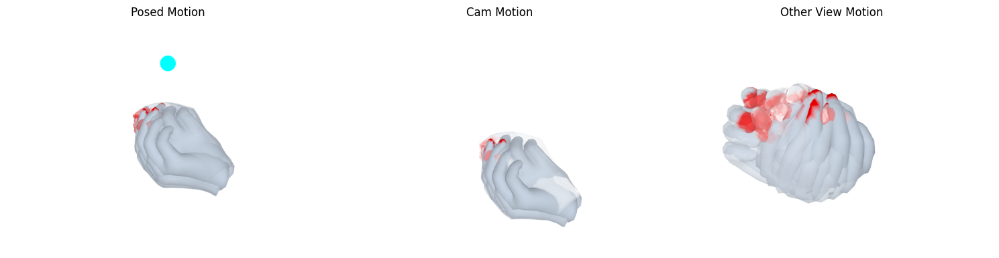

In [28]:
# plot rendered visualizations side by side
# lighter shades of hands mean farther away in time
plt.close()
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(pos_img) # this is centered at the centroid of the prediction motion in the camera view
ax[0].set_title("Posed Motion")
ax[0].axis('off')
ax[1].imshow(cam_img) # this is rendered in the camera view
ax[1].set_title("Cam Motion")
ax[1].axis('off')
ax[2].imshow(other_img) # this is rendered in the other view, showing the motion from a different perspective
ax[2].set_title("Other View Motion")
ax[2].axis('off')
plt.tight_layout()
plt.show()